In [1]:
import json
import os

import pandas as pd

# set up env vars

In [2]:
tmp_paths = dict(
    CIBERSORTX_INPUT_DATA_DIR=os.path.abspath('/tmp/csx/input'),
    CIBERSORTX_OUTPUT_DATA_DIR=os.path.abspath('/tmp/csx/output'),
)

os.environ.update(tmp_paths)

print(json.dumps(dict((k, os.environ[k]) for k in tmp_paths), indent=2, sort_keys=True))


{
  "CIBERSORTX_INPUT_DATA_DIR": "/tmp/csx/input",
  "CIBERSORTX_OUTPUT_DATA_DIR": "/tmp/csx/output"
}


In [3]:
input_files = dict(
    CIBERSORTX_MIXTURES=os.path.expanduser('~/gcsfuse-babasonicos/csx_example_files/Single_Cell_RNA-Seq_Melanoma_SuppFig_3b-d/mixture_melanoma_Tirosh_SuppFig_3b-d.txt'),
    CIBERSORTX_SIGMATRIX=os.path.expanduser('~/gcsfuse-babasonicos/csx_example_files/LM22.txt'),
)

for path in input_files.values():
    assert os.path.exists(path)

os.environ.update(input_files)

print(json.dumps(dict((k, os.environ[k]) for k in input_files), indent=2, sort_keys=True))


{
  "CIBERSORTX_MIXTURES": "/home/jupyter/gcsfuse-babasonicos/csx_example_files/Single_Cell_RNA-Seq_Melanoma_SuppFig_3b-d/mixture_melanoma_Tirosh_SuppFig_3b-d.txt",
  "CIBERSORTX_SIGMATRIX": "/home/jupyter/gcsfuse-babasonicos/csx_example_files/LM22.txt"
}


# verify input data

In [4]:
pd.read_csv(
    os.environ["CIBERSORTX_MIXTURES"],
    sep="\t",
    index_col=0,
).sort_index()

,53,58,59,60,65,67,71,72,74,75,78,79,80,81,82,84,88,89,94
GeneSymbol,,,,,,,,,,,,,,,,,,,
A1BG,29.955799,135.560624,164.675951,42.050063,44.209272,27.119934,103.002084,20.153980,93.252630,33.893007,247.868169,81.992139,74.577531,114.688141,149.905669,56.821192,60.909586,64.187814,66.920693
A1BG.AS1,76.750472,106.710946,0.000000,98.890379,70.428488,16.561347,30.216212,45.369717,187.014522,154.559889,116.276809,57.215316,60.450674,98.449838,27.820374,112.171204,136.751870,80.959908,160.159186
A1CF,4.293035,10.703480,7.683243,5.171856,0.485967,73.924881,2.722675,7.920910,4.578005,9.198082,3.354854,4.172604,6.067337,2.239416,2.473913,7.841586,3.980440,5.448009,4.813092
A2M,2509.057478,90.334429,1257.425330,80.917243,483.387704,56.810292,287.538847,53.139795,15.680017,326.562496,361.823685,15439.504164,1086.403593,8859.550003,6550.408857,1212.622209,3047.747325,556.980161,1979.800572
A2M.AS1,165.340434,627.675397,0.000000,119.285327,259.847730,59.198081,219.118788,228.316543,18.782954,25.884530,13.508224,65.699467,222.773578,250.800261,110.378361,81.321306,86.229563,86.209955,107.097322
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11A,210.406776,406.413108,40.761214,191.982234,60.105820,1071.493114,77.082305,205.986577,161.539647,282.805783,78.490569,136.676866,156.775369,89.537114,104.020282,142.714371,153.564134,162.339241,215.106305
ZYG11B,137.569280,236.921709,188.989891,187.103564,51.005259,696.949692,84.571078,173.880524,170.508125,248.379987,115.026851,181.546794,194.145560,84.425112,119.731724,149.399991,111.290067,138.637144,202.900680
ZYX,1101.767280,1315.280778,704.302282,781.906411,599.029492,231.198140,176.760243,391.304052,754.072964,832.928463,356.933911,460.836788,940.544647,1235.734794,1516.507585,1763.198822,1081.011577,552.576463,993.620308


In [5]:
pd.read_csv(
    os.environ["CIBERSORTX_SIGMATRIX"],
    sep="\t",
    index_col=0
).sort_index()

,B cells naive,B cells memory,Plasma cells,T cells CD8,T cells CD4 naive,T cells CD4 memory resting,T cells CD4 memory activated,T cells follicular helper,T cells regulatory (Tregs),T cells gamma delta,...,Monocytes,Macrophages M0,Macrophages M1,Macrophages M2,Dendritic cells resting,Dendritic cells activated,Mast cells resting,Mast cells activated,Eosinophils,Neutrophils
Gene symbol,,,,,,,,,,,,,,,,,,,,,
ABCB4,555.713449,10.744235,7.225819,4.311280,4.605860,7.406442,8.043976,6.469993,7.833082,9.312295,...,6.202496,7.951360,27.557710,121.432277,114.636747,4.872184,4.727985,34.113659,15.030530,14.906888
ABCB9,15.603544,22.094787,653.392328,24.223723,35.671507,30.048192,38.455423,17.604795,46.073657,19.715722,...,20.309426,56.251887,29.380878,40.390260,123.993306,23.384603,53.466757,23.615746,29.786442,33.679147
ACAP1,215.305951,321.621021,38.616872,1055.613378,1790.097170,922.152747,340.883424,1107.798265,1995.482601,280.075719,...,190.879024,48.972217,30.974254,23.055150,61.386550,26.412923,104.200198,73.607932,696.442802,596.025961
ACHE,15.117949,16.648847,22.123737,13.428288,27.187732,18.444927,13.441268,14.805542,24.652712,33.658448,...,16.375268,13.692963,1373.069620,48.585761,16.715474,193.159977,13.948778,20.501249,40.414927,22.766494
ACP5,605.897384,1935.201479,1120.104684,306.312519,744.656599,557.819820,248.546932,711.949744,958.916018,493.969120,...,512.931382,13644.172300,1062.475909,7633.960182,13825.053630,3989.865169,263.497930,323.381277,860.563374,307.142798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZNF204P,77.876897,42.946213,41.075062,151.959734,400.663184,168.895130,40.090641,52.228974,83.763177,129.598647,...,29.909746,26.843634,33.021233,27.461275,25.553860,36.165940,38.887463,25.206700,65.487837,27.485546
ZNF222,9.800664,7.203218,11.691368,71.911257,56.642511,15.081330,15.589903,182.938925,10.027797,13.843262,...,19.860610,70.824860,47.029368,148.622218,86.418190,39.918349,222.573611,211.493742,346.556451,26.825597
ZNF286A,737.859904,331.908761,73.882022,218.227036,5.598819,169.313128,190.874843,118.138051,136.868599,246.503817,...,11.043937,13.505845,36.038732,21.875639,15.080863,280.769931,77.840396,25.833293,7.473171,441.313469


# run CIBERSORTx

## set up files and folders

In [6]:
!rm -rf $CIBERSORTX_INPUT_DATA_DIR
!rm -rf $CIBERSORTX_OUTPUT_DATA_DIR

!mkdir -p $CIBERSORTX_INPUT_DATA_DIR
!mkdir -p $CIBERSORTX_OUTPUT_DATA_DIR

!rsync \
  $CIBERSORTX_MIXTURES \
  $CIBERSORTX_INPUT_DATA_DIR/mixtures.txt

!rsync \
  $CIBERSORTX_SIGMATRIX \
  $CIBERSORTX_INPUT_DATA_DIR/signature_matrix.txt

!tree -h $CIBERSORTX_INPUT_DATA_DIR

/tmp/csx/input
├── [6.0M]  mixtures.txt
└── [143K]  signature_matrix.txt

0 directories, 2 files


In [7]:
import numpy as np 

input_staging_path = os.path.join(os.environ["CIBERSORTX_INPUT_DATA_DIR"], "mixtures.txt")

def make_more_samples():
    df = pd.read_csv(
        input_staging_path,
        sep="\t",
        index_col=0,
    )
    rng = np.random.default_rng(seed=0)
    noise = rng.exponential(scale=1.0, size=df.values.shape)
    df_with_noise = df + noise
    df_with_noise.rename(columns=lambda name: f'{name}_noisy', inplace=True)
    return pd.concat([df, df_with_noise], axis=1)

make_more_samples().to_csv(input_staging_path, sep="\t")

In [8]:
pd.read_csv(
    input_staging_path,
    sep="\t",
    index_col=0,
).sort_index()

,53,58,59,60,65,67,71,72,74,75,...,75_noisy,78_noisy,79_noisy,80_noisy,81_noisy,82_noisy,84_noisy,88_noisy,89_noisy,94_noisy
GeneSymbol,,,,,,,,,,,,,,,,,,,,,
A1BG,29.955799,135.560624,164.675951,42.050063,44.209272,27.119934,103.002084,20.153980,93.252630,33.893007,...,35.106612,248.299525,82.101760,78.600881,116.377747,151.184623,58.078753,61.113792,65.782088,67.173615
A1BG.AS1,76.750472,106.710946,0.000000,98.890379,70.428488,16.561347,30.216212,45.369717,187.014522,154.559889,...,155.423387,116.769642,58.617485,62.219804,98.878844,29.983661,112.880620,136.832329,81.464912,160.182318
A1CF,4.293035,10.703480,7.683243,5.171856,0.485967,73.924881,2.722675,7.920910,4.578005,9.198082,...,11.283696,3.589766,4.217028,6.646766,3.701680,2.942943,7.881840,11.055698,9.802067,6.697954
A2M,2509.057478,90.334429,1257.425330,80.917243,483.387704,56.810292,287.538847,53.139795,15.680017,326.562496,...,331.795961,363.173142,15440.246756,1086.431393,8859.748659,6550.825510,1214.087956,3048.417074,557.665310,1979.808448
A2M.AS1,165.340434,627.675397,0.000000,119.285327,259.847730,59.198081,219.118788,228.316543,18.782954,25.884530,...,27.385604,14.669018,66.278019,223.112938,253.363437,110.873002,83.134123,86.274273,86.249752,108.045933
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11A,210.406776,406.413108,40.761214,191.982234,60.105820,1071.493114,77.082305,205.986577,161.539647,282.805783,...,284.884878,78.736598,138.145611,157.111511,90.934470,106.372189,142.885555,154.514809,162.668762,215.129090
ZYG11B,137.569280,236.921709,188.989891,187.103564,51.005259,696.949692,84.571078,173.880524,170.508125,248.379987,...,249.084306,116.149299,182.568940,195.865358,84.445964,120.973499,151.658532,111.554556,141.650234,203.085412
ZYX,1101.767280,1315.280778,704.302282,781.906411,599.029492,231.198140,176.760243,391.304052,754.072964,832.928463,...,833.012420,357.133541,461.141321,941.309477,1235.736701,1518.322560,1765.113988,1081.288688,553.508151,993.870982


## infer fractions


### run

In [9]:
!docker run \
  --rm \
  -v $CIBERSORTX_INPUT_DATA_DIR:/src/data \
  -v $CIBERSORTX_OUTPUT_DATA_DIR:/src/outdir \
  --user "$(id -u):$(id -g)" \
  cibersortx/fractions:latest \
  --username lyronctk@stanford.edu \
  --token dfeba2c8b9d61daebee5fa87026b8e56 \
  --mixture mixtures.txt \
  --sigmatrix signature_matrix.txt \
  --perm 10 \
  --verbose TRUE
  # --rmbatchSmode TRUE \
  # --sourceGEPs signature_matrix.txt


>Running CIBERSORTxFractions...
>[Options] username: lyronctk@stanford.edu
>[Options] token: dfeba2c8b9d61daebee5fa87026b8e56
>[Options] mixture: mixtures.txt
>[Options] sigmatrix: signature_matrix.txt
>[Options] perm: 10
>[Options] verbose: TRUE
>=============CIBERSORTx Settings===============
>Mixture file: /src/data/mixtures.txt
>Signature matrix file: /src/data/signature_matrix.txt
>Number of permutations set to: 10
>Enable verbose output
>==================CIBERSORTx===================
P	10	%
P	20	%
P	30	%
P	40	%
P	50	%
P	60	%
P	70	%
P	80	%
P	90	%
P	100	%
column B cells naive B cells memory Plasma cells T cells CD8 T cells CD4 naive T cells CD4 memory resting T cells CD4 memory activated T cells follicular helper T cells regulatory (Tregs) T cells gamma delta NK cells resting NK cells activated Monocytes Macrophages M0 Macrophages M1 Macrophages M2 Dendritic cells resting Dendritic cells activated Mast cells resting Mast cells activated Eosinophils Neutrophils P-value Correlation 

### check results

In [10]:
!ls -lRt /tmp/csx

/tmp/csx:
total 8
drwxr-xr-x 2 jupyter jupyter 4096 Jul  6 23:09 output
drwxr-xr-x 2 jupyter jupyter 4096 Jul  6 23:08 input

/tmp/csx/output:
total 20
-rw-r--r-- 1 jupyter jupyter 19667 Jul  6 23:09 CIBERSORTx_Results.txt

/tmp/csx/input:
total 14600
-rw-r--r-- 1 jupyter jupyter 14801719 Jul  6 23:08 mixtures.txt
-rw-r--r-- 1 jupyter jupyter   146759 Jul  6 23:08 signature_matrix.txt


In [11]:
fractions_inferred = pd.read_csv(
    os.path.join(os.environ["CIBERSORTX_OUTPUT_DATA_DIR"], "CIBERSORTx_Results.txt"),
    sep="\t",
    index_col=0
)[0:19]

fractions_inferred["B cells total"] = fractions_inferred["B cells naive"] + fractions_inferred["B cells memory"]

fractions_inferred

,B cells naive,B cells memory,Plasma cells,T cells CD8,T cells CD4 naive,T cells CD4 memory resting,T cells CD4 memory activated,T cells follicular helper,T cells regulatory (Tregs),T cells gamma delta,...,Dendritic cells resting,Dendritic cells activated,Mast cells resting,Mast cells activated,Eosinophils,Neutrophils,P-value,Correlation,RMSE,B cells total
Mixture,,,,,,,,,,,,,,,,,,,,,
53,0.000000,0.015384,0.000000,0.280293,0.000000,0.000000,0.045973,0.117313,0.004548,0.096684,...,0.000000,0.007200,0.000000,0.118924,0.000000,0.002166,0.1,0.721300,0.693554,0.015384
58,0.000000,0.000000,0.004939,0.532747,0.000000,0.000000,0.019967,0.122140,0.024385,0.164834,...,0.001899,0.004144,0.000000,0.017647,0.005443,0.002348,0.1,0.642552,0.769082,0.000000
59,0.000000,0.000000,0.000000,0.000327,0.000000,0.182090,0.000000,0.022774,0.011453,0.000000,...,0.000000,0.137584,0.000000,0.448379,0.030372,0.000000,0.5,0.053949,1.159639,0.000000
60,0.202137,0.112195,0.000000,0.201526,0.000000,0.000000,0.106143,0.122241,0.023112,0.045578,...,0.000000,0.009021,0.000000,0.025587,0.000000,0.001916,0.1,0.742626,0.696043,0.314332
65,0.007512,0.024431,0.000000,0.549358,0.000000,0.026128,0.054309,0.174852,0.000000,0.119281,...,0.001285,0.007774,0.000000,0.000000,0.006515,0.000000,0.1,0.540302,0.851926,0.031943
67,0.163529,0.000000,0.000000,0.401127,0.000000,0.000000,0.026012,0.214904,0.029485,0.108802,...,0.000000,0.035337,0.000000,0.000000,0.002412,0.000512,0.1,0.595941,0.802360,0.163529
71,0.012678,0.000000,0.000000,0.481958,0.000000,0.000000,0.131012,0.173507,0.015232,0.074878,...,0.003566,0.009770,0.000000,0.000000,0.004459,0.000000,0.1,0.533654,0.853645,0.012678
72,0.151230,0.038283,0.000000,0.160341,0.156722,0.269250,0.022916,0.063697,0.020276,0.012378,...,0.000000,0.017251,0.000000,0.035369,0.009916,0.000000,0.1,0.609516,0.794011,0.189514
74,0.002758,0.001587,0.001366,0.421992,0.000000,0.000000,0.087888,0.112394,0.000000,0.142457,...,0.001274,0.002814,0.000000,0.035332,0.005006,0.000398,0.1,0.628076,0.781388,0.004345


In [12]:
from pprint import pprint

pprint(list(sorted(fractions_inferred.columns)))

['B cells memory',
 'B cells naive',
 'B cells total',
 'Correlation',
 'Dendritic cells activated',
 'Dendritic cells resting',
 'Eosinophils',
 'Macrophages M0',
 'Macrophages M1',
 'Macrophages M2',
 'Mast cells activated',
 'Mast cells resting',
 'Monocytes',
 'NK cells activated',
 'NK cells resting',
 'Neutrophils',
 'P-value',
 'Plasma cells',
 'RMSE',
 'T cells CD4 memory activated',
 'T cells CD4 memory resting',
 'T cells CD4 naive',
 'T cells CD8',
 'T cells follicular helper',
 'T cells gamma delta',
 'T cells regulatory (Tregs)']


# compare fractions with groundtruth

In [13]:
fractions_groundtruth = pd.read_csv(
    "/home/jupyter/gcsfuse-babasonicos/csx_example_files/groundtruth_Melanoma_Tirosh_et_al_SuppFig3b-d.txt",
    sep="\t",
    index_col=0
)

fractions_groundtruth

,Malignant,Endothelial cells,CAF,T cells CD8,NK cells,Macrophages,T cells CD4,B cells
GeneSymbol,,,,,,,,
53,0.1280,0.0880,0.0320,0.2000,0.0800,0.0960,0.3760,0.0000
58,0.0000,0.0000,0.0000,0.6508,0.0317,0.0159,0.2857,0.0159
59,0.8710,0.0000,0.1129,0.0000,0.0000,0.0161,0.0000,0.0000
60,0.0448,0.0000,0.0000,0.1940,0.0498,0.0199,0.2139,0.4776
65,0.0755,0.0000,0.0000,0.4717,0.0000,0.0189,0.3396,0.0943
67,0.0000,0.0000,0.0000,0.3059,0.0118,0.0000,0.4588,0.2235
71,0.6835,0.0000,0.0000,0.1899,0.0000,0.0253,0.1013,0.0000
72,0.0000,0.0000,0.0000,0.1634,0.0065,0.0000,0.6013,0.2288
74,0.0000,0.0000,0.0000,0.6496,0.0073,0.0365,0.2117,0.0949


In [14]:
from pprint import pprint

pprint(list(sorted(fractions_groundtruth.columns)))

['B cells',
 'CAF',
 'Endothelial cells',
 'Macrophages',
 'Malignant',
 'NK cells',
 'T cells CD4',
 'T cells CD8']


In [15]:
import plotly.express as px

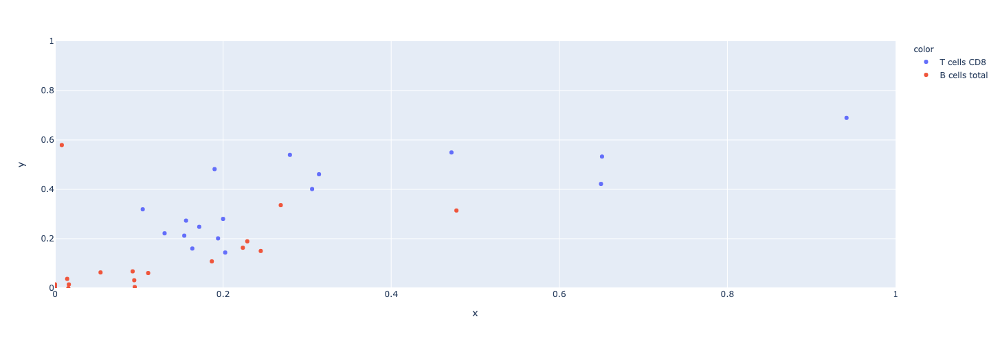

In [17]:
fig = px.scatter(
    x=fractions_groundtruth[["T cells CD8", "B cells"]].stack().values,
    y=fractions_inferred[["T cells CD8", "B cells total"]].stack().values,
    color=fractions_inferred[["T cells CD8", "B cells total"]].stack().reset_index()["level_1"]
)
fig.update_layout(
    width = 600,
    height = 500,
)
fig.update_xaxes(
    range=(0, 1)
)
fig.update_yaxes(
    range=(0, 1),
)


## infer GEPs

In [18]:
!docker run \
  --rm \
  -v $CIBERSORTX_INPUT_DATA_DIR:/src/data \
  -v $CIBERSORTX_OUTPUT_DATA_DIR:/src/outdir \
  --user "$(id -u):$(id -g)" \
  cibersortx/gep:latest \
  --username lyronctk@stanford.edu \
  --token dfeba2c8b9d61daebee5fa87026b8e56 \
  --mixture mixtures.txt \
  --sigmatrix signature_matrix.txt \
  --cibresults CIBERSORTx_Results.txt \
  --threads 4


>Running CIBERSORTx GEP imputation (representative profiles only)...
>[Options] username: lyronctk@stanford.edu
>[Options] token: dfeba2c8b9d61daebee5fa87026b8e56
>[Options] mixture: mixtures.txt
>[Options] sigmatrix: signature_matrix.txt
>[Options] cibresults: CIBERSORTx_Results.txt
>[Options] threads: 4
>Previous estimates of cell proportions detected. To rerun, use redocibersort=TRUE.
>Loaded 38 mixture samples, 23684 genes, and 22 cell subsets...
>Imputing representative cell type GEPs...done.
>Writing output to disk...done.
>Running time (sec): 60


### check results

In [19]:
!ls -lRt $CIBERSORTX_OUTPUT_DATA_DIR

/tmp/csx/output:
total 26960
-rw-r--r-- 1 jupyter jupyter 2129799 Jul  6 23:10 CIBERSORTxGEP_SM_GEPs_Filtered.txt
-rw-r--r-- 1 jupyter jupyter 1539296 Jul  6 23:10 CIBERSORTxGEP_GEPs_ThresholdPlots.pdf
-rw-r--r-- 1 jupyter jupyter 2129799 Jul  6 23:10 CIBERSORTxGEP_GEPs_Filtered.txt
-rw-r--r-- 1 jupyter jupyter 6375326 Jul  6 23:09 CIBERSORTxGEP_GEPs_StdErrs.txt
-rw-r--r-- 1 jupyter jupyter 1208859 Jul  6 23:09 CIBERSORTxGEP_GEPs_Qvals.txt
-rw-r--r-- 1 jupyter jupyter 3942940 Jul  6 23:09 CIBERSORTxGEP_GEPs_Pvals.txt
-rw-r--r-- 1 jupyter jupyter 6457120 Jul  6 23:09 CIBERSORTxGEP_GEPs_CVs.txt
-rw-r--r-- 1 jupyter jupyter 3778382 Jul  6 23:09 CIBERSORTxGEP_GEPs.txt
-rw-r--r-- 1 jupyter jupyter   12063 Jul  6 23:09 CIBERSORTxGEP_Weights.txt
-rw-r--r-- 1 jupyter jupyter   19667 Jul  6 23:09 CIBERSORTx_Results.txt


In [20]:
inferred_geps = pd.read_csv(
    os.path.join(os.environ["CIBERSORTX_OUTPUT_DATA_DIR"], "CIBERSORTxGEP_GEPs_Filtered.txt"),
    sep="\t",
    index_col=0,
)

In [21]:
inferred_geps  #.clip(upper=100000)

,B cells naive,B cells memory,Plasma cells,T cells CD8,T cells CD4 naive,T cells CD4 memory resting,T cells CD4 memory activated,T cells follicular helper,T cells regulatory (Tregs),T cells gamma delta,...,Monocytes,Macrophages M0,Macrophages M1,Macrophages M2,Dendritic cells resting,Dendritic cells activated,Mast cells resting,Mast cells activated,Eosinophils,Neutrophils
GeneSymbol,,,,,,,,,,,,,,,,,,,,,
A1BG,0.000000,0.000000,0.0,NaN,NaN,0.0,NaN,0.0,NaN,268.702130,...,NaN,1695.401271,2562.528659,0.0,NaN,NaN,NaN,0.0,NaN,9011.332147
A1BG.AS1,NaN,NaN,NaN,94.691546,390.838937,0.0,NaN,0.0,0.0,NaN,...,NaN,NaN,NaN,0.0,NaN,0.0,NaN,0.0,0.0,0.000000
A1CF,36.507165,0.000000,NaN,NaN,0.000000,0.0,0.0,NaN,NaN,0.000000,...,0.000000,0.000000,0.000000,0.0,0.0,NaN,0.0,NaN,NaN,0.000000
A2M,NaN,0.000000,0.0,NaN,NaN,NaN,0.0,0.0,0.0,22497.558064,...,NaN,NaN,NaN,0.0,0.0,0.0,0.0,NaN,NaN,NaN
A2M.AS1,NaN,0.000000,NaN,NaN,458.775364,NaN,NaN,NaN,NaN,NaN,...,NaN,0.000000,0.000000,0.0,NaN,0.0,0.0,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11A,625.815553,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,...,0.000000,0.000000,0.000000,0.0,NaN,NaN,0.0,NaN,0.0,NaN
ZYG11B,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,...,NaN,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ZYX,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,2795.846334,...,11455.097865,NaN,NaN,NaN,NaN,0.0,0.0,NaN,0.0,110963.169147


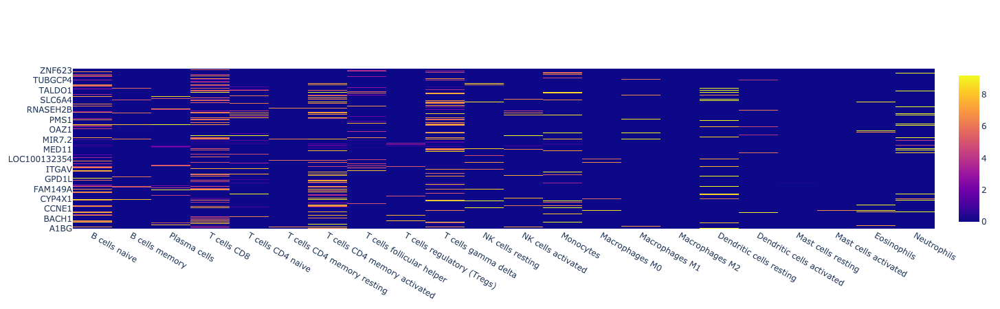

In [22]:
import plotly.graph_objects as go

fig = go.Figure(data=go.Heatmap(
                   z=np.log(inferred_geps.fillna(0).clip(upper=10000).values + 1),
                   x=inferred_geps.columns,
                   y=inferred_geps.index,
                   hoverongaps = False
))
fig.show()

# CLI instructions

In [23]:
!docker run \
  --rm \
  -v $CIBERSORTX_INPUT_DATA_DIR:/src/data \
  -v $CIBERSORTX_OUTPUT_DATA_DIR:/src/outdir \
  cibersortx/gep:latest  # image names: gep, fractions, hires


CIBERSORTx - impute representative cell type-specific expression profiles

For instructions and terms of use, see cibersortx.stanford.edu

Usage:
docker run <bind_mounts> cibersortxgep [Options]

Bind Mounting:
> 2 directories must be bind mounted to be accessed within the docker container: 
    1) Input file dir 
        > Format: -v {dir_path}:/src/data 
        > contains (if applicable): {mixture, sigmatrix, classes, sourceGEPs 
                                     refsample, groundtruth, degclasses}  
    2) Outdir 
        > Format: -v {dir_path}:/src/outdir 
        > contains (if applicable): {cibresults} 
> Note: Absolute paths required

Authorization Parameters:
--username      <string>  Email used for login to cibersortx.stanford.edu
--token         <string>  Token associated with current IP address (generated on website)

Primary Options:
--mixture       <file_name>   Mixture matrix [required]
--sigmatrix     <file_name>   Signature matrix [required]
--classes       <file_

* with batch correction, usually S mode?
* add permutations for significance testing
* QN - FALSE

```
--rmbatchSmode TRUE \
--perm 100 \
```

